In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from datetime import datetime

from os import listdir
from os.path import isfile, join

rootfolder="/home/aulegoup/Optical_fibers/Absorption_spectra_experiments/"

# Extract all from folder

In [2]:
FILES=[
        {'NameFoldExtract':"2024-05-07 - sample B test WL annealing and annealing at 77K",
        'NameSubFoldTemp':"Temperature data",
        'NameCSVforTemp':"2024-05-07 Tue 11h57min45s - fiber T curve - dur 5152s.csv",
        'firstfilenb':0},

       {'NameFoldExtract':"2024-05-10 - sample B new test post thermal annealing",
        'NameSubFoldTemp':"Temperature data",
        'NameCSVforTemp':"2024-05-10 Fri 13h06min59s - fiber T curve - dur 7347s.csv",
        'firstfilenb':0},

       {'NameFoldExtract':"2024-07-24 - sample B new test post thermal annealing twice",
        'NameSubFoldTemp':"Temperature data",
        'NameCSVforTemp':"2024-07-24 Wed 14h36min36s - fiber T curve - dur 12081s.csv",
        'firstfilenb':0},

       {'NameFoldExtract':"2024-07-25 - sample B new test post TA 5min wait",
        'NameSubFoldTemp':"Temperature data",
        'NameCSVforTemp':"2024-07-25 Thu 17h07min44s - fiber T curve - dur 1883s.csv",
        'firstfilenb':0},

       {'NameFoldExtract':"2024-07-26 - sample B new test post TA 3min wait",
        'NameSubFoldTemp':None,
        'NameCSVforTemp':None,
        'firstfilenb':0},
]


In [3]:
DIC_fprop={}

for idfiles,dicfile in enumerate(FILES) :
    #######################################################################################################
    #First, let's extract all the time information from the filenames.
    #######################################################################################################
    
    mypath=join(rootfolder,dicfile["NameFoldExtract"])
    LISTFILES = sorted([f for f in listdir(mypath) if isfile(join(mypath, f))])[dicfile['firstfilenb']:]
    Nfiles=len(LISTFILES)
    
    #List file properties
    DIC_fprop[idfiles]={
        "Name2Id":{},
        "Id2Name":{},
        "Id2Datetime":{},
        "Id2WL":{},
        "Id2LEVEL":{}
    }
    for i,f in enumerate(LISTFILES):
        DATE=f.split('_')[0].split('W')[1]
        YY=DATE[:4]
        MM=DATE[4:6]
        DD=DATE[6:8]
        H=f.split('.')[0].split('_')[1][:2]
        M=f.split('.')[0].split('_')[1][2:4]
        S=f.split('.')[0].split('_')[1][4:6]
        ISOTIME=f"{YY}-{MM}-{DD}T{H}:{M}:{S}-05:00"
        DIC_fprop[idfiles]["Name2Id"][f]=i
        DIC_fprop[idfiles]["Id2Name"][i]=f
        DIC_fprop[idfiles]["Id2Datetime"][i]=datetime.fromisoformat(ISOTIME)
        if i==0:
            print(DIC_fprop[idfiles])
    
    
    #######################################################################################################
    #Now, let's extract the spectra from the files:
    #######################################################################################################
    
    for i in range(Nfiles):
        with open(join(mypath,DIC_fprop[idfiles]["Id2Name"][i]),'r') as f:
                LINES=f.readlines()
                N=len(LINES)
                n=0
                while "[TRACE DATA]" not in LINES[n]:
                    n+=1
                WL_nm,LEVEL_dBm=[],[]
                for j in range(n+1,N):
                    l=LINES[j]
                    if '.' in l:
                        wl=float((l.split(','))[0])
                        lvl=float((l.split(','))[1])
                        if wl>=600 and wl<=1700:
                            WL_nm+=[wl]
                            LEVEL_dBm+=[lvl]
        WL_nm=np.array(WL_nm)
        if i==0:
            WL_nm0=WL_nm
        elif np.any(WL_nm0!=WL_nm):
            raise NameError(f"WL difference at id {i}")
        DIC_fprop[idfiles]["Id2LEVEL"][i]=np.array(LEVEL_dBm)
    
    DIC_fprop[idfiles]["WL_nm"]=np.array(WL_nm)


def add_subplot_axes(ax,rect,axisbg='w'):
    #https://stackoverflow.com/questions/17458580/embedding-small-plots-inside-subplots-in-matplotlib
    fig = plt.gcf()
    box = ax.get_position()
    width = box.width
    height = box.height
    inax_position  = ax.transAxes.transform(rect[0:2])
    transFigure = fig.transFigure.inverted()
    infig_position = transFigure.transform(inax_position)    
    x = infig_position[0]
    y = infig_position[1]
    width *= rect[2]
    height *= rect[3]  # <= Typo was here
    subax = fig.add_axes([x,y,width,height])#,facecolor=facecolor)  # matplotlib 2.0+
    #subax = fig.add_axes([x,y,width,height],axisbg=axisbg)
    x_labelsize = subax.get_xticklabels()[0].get_size()
    y_labelsize = subax.get_yticklabels()[0].get_size()
    x_labelsize *= rect[2]**0.5
    y_labelsize *= rect[3]**0.5
    subax.xaxis.set_tick_params(labelsize=x_labelsize)
    subax.yaxis.set_tick_params(labelsize=y_labelsize)
    return subax


{'Name2Id': {'W20240507_120013.CSV': 0}, 'Id2Name': {0: 'W20240507_120013.CSV'}, 'Id2Datetime': {0: datetime.datetime(2024, 5, 7, 12, 0, 13, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=68400)))}, 'Id2WL': {}, 'Id2LEVEL': {}}
{'Name2Id': {'W20240510_130930.CSV': 0}, 'Id2Name': {0: 'W20240510_130930.CSV'}, 'Id2Datetime': {0: datetime.datetime(2024, 5, 10, 13, 9, 30, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=68400)))}, 'Id2WL': {}, 'Id2LEVEL': {}}
{'Name2Id': {'W20240724_143946.CSV': 0}, 'Id2Name': {0: 'W20240724_143946.CSV'}, 'Id2Datetime': {0: datetime.datetime(2024, 7, 24, 14, 39, 46, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=68400)))}, 'Id2WL': {}, 'Id2LEVEL': {}}
{'Name2Id': {'W20240725_171054.CSV': 0}, 'Id2Name': {0: 'W20240725_171054.CSV'}, 'Id2Datetime': {0: datetime.datetime(2024, 7, 25, 17, 10, 54, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=68400)))}, 'Id2WL': {}, 'Id2LEVEL': {}}
{'Name2Id': {'W20240726_114

75


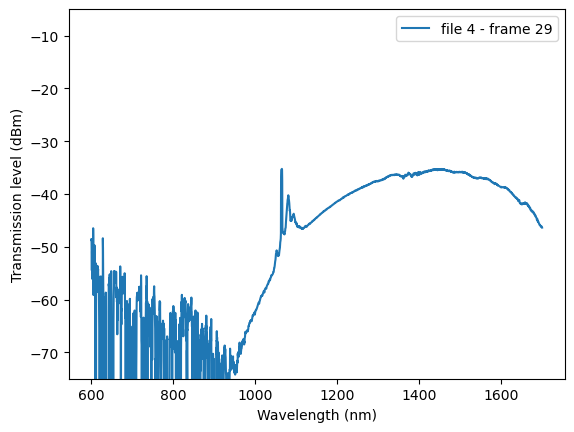

In [4]:
fileid=4
idtest=29

print(len( DIC_fprop[fileid]["Id2LEVEL"]))

fig, ax = plt.subplots()
# fig.set_dpi(2000)

ax.plot(WL_nm, DIC_fprop[fileid]["Id2LEVEL"][idtest],label=f"file {fileid} - frame {idtest}")
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Transmission level (dBm)")
ax.set_ylim(-75, -5)
ax.legend()
plt.show()

# Transmitted spectrum - multiple moments together without animation

In [5]:
IDFILES = [2,2,3,4]
FIRST_IDS = [836,5178,764,29]
LABELS = ["a: after 10min - day 1","b: after 10s wait - day 1","c: after 5min wait - day 2","d: after 3min wait - day 3"]
LABELS_res = ["Residual b-a","Residual c-a","Residual d-a"]
COLORS = ["tab:blue","tab:orange","tab:green","tab:red","tab:purple","tab:brown","tab:pink","tab:gray","tab:olive","tab:cyan"]
extract_title = ""
smalltitle= "First spectra after irradiations a-d and different waiting times, with synchronized trigger"
filenameplot = "Comparison 07-24 07-25 07-26 - first spectrum after wait.pdf" 
SAVE=False

fig, axs = plt.subplots(2, figsize=[6.4, 4.8*1.5], gridspec_kw={'height_ratios': [2, 1]})
fig.set_dpi(2000)

LINES = [axs[0].plot(WL_nm, DIC_fprop[IDFILES[i]]["Id2LEVEL"][ID],label=LABELS[i],color=COLORS[i]) for i,ID in enumerate(FIRST_IDS)]
axs[0].set_xlabel("Wavelength (nm)")
axs[0].set_ylabel("Transmission level (dBm)")
fig.suptitle(extract_title,fontsize=12)
axs[0].set_title(smalltitle,fontsize=10)
axs[0].set_ylim(-75, -5)
axs[0].legend()
RESIDUALS = [axs[1].plot(WL_nm[WL_nm>960], (DIC_fprop[IDFILES[i+1]]["Id2LEVEL"][ID]-DIC_fprop[IDFILES[0]]["Id2LEVEL"][FIRST_IDS[0]])[WL_nm>960],label=LABELS_res[i],color=COLORS[i+1]) for i,ID in enumerate(FIRST_IDS[1:])]
axs[1].set_xlim(axs[0].get_xlim())
axs[1].set_ylim(-5,3)
axs[1].legend()
axs[1].set_ylabel("Residual (dBm)")
axs[1].set_xlabel("Wavelength (nm)")
if not(SAVE):
    plt.show()
else:
    plt.savefig(filenameplot)

In [7]:
IDFILES = 7*[1]
FIRST_IDS = [0,540,900,1411,2046,2664,3188]
LABELS = [f"before 2.{letter}" for letter in ['a','b','c','d','e','f']]+["final spectrum"]
LABELS_res = [f"Residual 2.{letter}-2.a" for letter in ['b','c','d','e','f']]+["residual final-2.a"]
COLORS = ["tab:blue","tab:orange","tab:green","tab:red","tab:purple","tab:brown","tab:pink","tab:gray","tab:olive","tab:cyan"]
extract_title = ""
smalltitle= "Transmitted spectrum before irradiations 2.a-2.f and after the last annealing step"
filenameplot = "2024-05-10 - 77AnnealingTest2Start_notitle.pdf" 
SAVE=False

fig, axs = plt.subplots(2, figsize=[6.4, 4.8*1.5], gridspec_kw={'height_ratios': [2, 1]})
fig.set_dpi(2000)

LINES = [axs[0].plot(WL_nm, DIC_fprop[IDFILES[i]]["Id2LEVEL"][ID],label=LABELS[i],color=COLORS[i]) for i,ID in enumerate(FIRST_IDS)]
axs[0].set_xlabel("Wavelength (nm)")
axs[0].set_ylabel("Transmission level (dBm)")
fig.suptitle(extract_title,fontsize=12)
axs[0].set_title(smalltitle,fontsize=10)
axs[0].set_ylim(-75, -5)
axs[0].legend()
RESIDUALS = [axs[1].plot(WL_nm[WL_nm>0], (DIC_fprop[IDFILES[i+1]]["Id2LEVEL"][ID]-DIC_fprop[IDFILES[0]]["Id2LEVEL"][FIRST_IDS[0]])[WL_nm>0],label=LABELS_res[i],color=COLORS[i+1]) for i,ID in enumerate(FIRST_IDS[1:])]
axs[1].set_xlim(axs[0].get_xlim())
axs[1].set_ylim(-5,3)
axs[1].legend(loc='right')
axs[1].set_ylabel("Residual (dBm)")
axs[1].set_xlabel("Wavelength (nm)")
if not(SAVE):
    plt.show()
else:
    plt.savefig(filenameplot)

In [63]:
IDFILES = [2,2]
FIRST_IDS = [311,4912]
LABELS = ["before 3.a","before 4.a"]
extract_title = ""
smalltitle= "Spectrum before irradiations 3.a and 4.a"
filenameplot = "Comparison 07-24 07-24 - spectrum before irrad.png" 
SAVE=False

fig, ax = plt.subplots()
fig.set_dpi(2000)

LINES = [ax.plot(WL_nm, DIC_fprop[IDFILES[i]]["Id2LEVEL"][ID],label=LABELS[i]) for i,ID in enumerate(FIRST_IDS)]
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Transmission level (dBm)")
fig.suptitle(extract_title,fontsize=12)
# ax.set_title(f"Transmitted spectrum after {0*Tsweep:.1f} seconds of annealing",fontsize=10)
ax.set_title(smalltitle,fontsize=10)
ax.set_ylim(-75, -5)
ax.legend()
if not(SAVE):
    plt.show()
if SAVE:
    plt.savefig(filenameplot)

In [21]:
IDFILES = [2,2]
FIRST_IDS = [1,313]
LABELS = ["SuperK light source typical spectrum through a pristine fiber","Typical noise level"]
extract_title = ""
smalltitle= "Resolution: 2 nm. Sensitivity: 'MID'. Sampling: 2751(MANU). 2x speed. Angled PC correction."
filenameplot = "NoiseFloor.pdf" 
SAVE=True

fig, ax = plt.subplots()
fig.set_dpi(2000)

LINES = [ax.plot(WL_nm, DIC_fprop[IDFILES[i]]["Id2LEVEL"][ID],label=LABELS[i]) for i,ID in enumerate(FIRST_IDS)]
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Transmission level (dBm)")
fig.suptitle(extract_title,fontsize=12)
# ax.set_title(f"Transmitted spectrum after {0*Tsweep:.1f} seconds of annealing",fontsize=10)
ax.set_title(smalltitle,fontsize=8)#10)
# ax.set_ylim(-75, -5)
ax.set_ylim(-90, 10)
ax.legend()
if not(SAVE):
    plt.show()
if SAVE:
    plt.savefig(filenameplot)

# Transmitted spectrum - multiple moments together without animation

In [6]:
IDFILES = [0,1]
FIRST_IDS = [287,426]
LABELS = ["1.a: after no wait (first full sp.)","2.a: after 5min wait (first full sp.)"]
extract_title = ""
smalltitle= "First full spectra after irradiations 1.a and 2.a and different waiting times"
filenameplot = "Comparison 05-10 05-07 - first spectrum after.png" 
SAVE=True

fig, ax = plt.subplots()
fig.set_dpi(2000)

LINES = [ax.plot(WL_nm, DIC_fprop[IDFILES[i]]["Id2LEVEL"][ID],label=LABELS[i]) for i,ID in enumerate(FIRST_IDS)]
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Transmission level (dBm)")
fig.suptitle(extract_title,fontsize=12)
# ax.set_title(f"Transmitted spectrum after {0*Tsweep:.1f} seconds of annealing",fontsize=10)
ax.set_title(smalltitle,fontsize=10)
ax.set_ylim(-75, -5)
ax.legend()
if not(SAVE):
    plt.show()
if SAVE:
    plt.savefig(filenameplot)

### Animation of the absorption spectrum

Animation size has reached 21015913 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


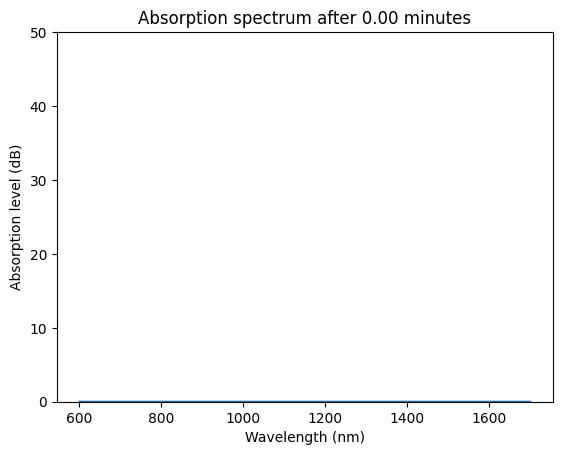

In [7]:
fig, ax = plt.subplots()
Line, = ax.plot(WL_nm, DIC_fprop[idfile]["Id2ABS"][0])
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Absorption level (dB)")
ax.set_title(f"Transmitted spectrum for file after {0*Tsweep/60:.2f} minutes")
ax.set_ylim(0,50)

def update(frame):
    Line.set_ydata(DIC_fprop[idfile]["Id2ABS"][frame])
    ax.set_title(f"Absorption spectrum after {frame * Tsweep / 60:.2f} minutes")
    return Line,

ani = animation.FuncAnimation(fig=fig, func=update, frames=Nfiles - 1, interval=30)
HTML(ani.to_jshtml())
ani.save(join(rootfolder,f"Animation - absorption - {NameFoldExtract}.gif"))